### AI Lab -  Assignment 5 - CH22M503

#### Author - Aloy Banerjee
###### Roll No. CH22M503

## Question:
##### Please use the dataset provided for this assignment. You have to work only with the file with your roll number specified on it. The feature columns are x0, x1, x2,. . . ,x26 and the class column is y.
##### Q1 Apply the k-means clustering algorithm to the data and evaluate its performance. Use the class column as the true class. 
##### Q2 Use hierarchical clustering on the data and report the effect of the parameters linkage and distance metric on the number of clusters obtained.
##### Q3 Cluster the given data using spectral clustering. Are the obtained clusters better than the ones obtined from K-means or hierarchical clustering? 
##### Q4 Visualize the clusters using the UMAP or tSNE algorithm. 

#### Importing Library

In [1]:
#Import library 
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import math
from sklearn.cluster import KMeans, AgglomerativeClustering, SpectralClustering
from sklearn.metrics import rand_score, silhouette_score, accuracy_score, adjusted_rand_score
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

import umap.umap_ as umap
from sklearn.manifold import TSNE

import warnings
warnings.filterwarnings('ignore')

sns.set(context="notebook", palette="viridis", style="darkgrid", font_scale=1.0, color_codes=True,rc={'figure.figsize':(14,10)})

#### Common variable declaration

In [28]:
workingDir = 'E:\\Document\\M-Tech\\M-Tech Class\\2nd Trimester\\Assignment\\AI Lab\\Assignment 5\\Datasets'
dataset_fileName = '20.csv'
random_state = 42
cluster = 3
df_analyzer_hierarchical = []
df_analyzer_hierarchical_const = []

#### Common function

In [69]:
def plot_dendrogram(input_data, linkage_method, distance_metric):
    '''Function to create dendograme based on the input dataset, linkage method and distance metric'''    
    linkage_init = linkage(input_data, method=linkage_method, metric=distance_metric)
    dendrogram(linkage_init)
    plt.title(f'Linkage method: {linkage_method}, Distance metric: {distance_metric}')
    plt.show() 

def evaluation_hierarchical_cluster_const_distancethreshold(input_data, linkage_method, distance_metric, dataset, clusters=3):
    '''Evaluation of hierarchical clustering and reveal the number of cluster required for differnt combination'''
    print(f'============Linkage method: {linkage_method}, Distance metric: {distance_metric}')
    linkage_init = linkage(input_data, method=linkage_method, metric=distance_metric)
    y_pred_hierarchical = pd.Series(fcluster(linkage_init, t=clusters, criterion='maxclust'), index=dataset.index)     
    
    clust_agglo = AgglomerativeClustering(n_clusters=None, metric = distance_metric, linkage = linkage_method, distance_threshold = 0.1)
    y_pred_agglo_hierarchical = clust_agglo.fit_predict(input_data, dataset["y"])    
    print(f'Cluster labels for each point : {clust_agglo.labels_}')
    #print(len(np.unique(clust_agglo.labels_)))
    numCluster = 1+np.amax(clust_agglo.labels_)
    print(f'No of Cluster : {numCluster}')
    
    print('Hierarchical Clustering using fcluster:')
    print(f'Accuracy Score: {accuracy_score(dataset["y"], y_pred_hierarchical):.4f}')
    print(f'Silhouette score: {silhouette_score(input_data, y_pred_hierarchical):.4f}')
    print(f'Adjusted Rand score: {adjusted_rand_score(dataset["y"], y_pred_hierarchical):.4f}') 
    print(f'Rand score: {rand_score(dataset["y"], y_pred_hierarchical):.4f}') 
    
    print('Hierarchical Clustering using Agglomerative Clustering:')
    print(f'Accuracy Score: {accuracy_score(dataset["y"], y_pred_agglo_hierarchical):.4f}')
    print(f'Silhouette score: {silhouette_score(input_data, y_pred_agglo_hierarchical):.4f}')
    print(f'Adjusted Rand score: {adjusted_rand_score(dataset["y"], y_pred_agglo_hierarchical):.4f}') 
    print(f'Rand score: {rand_score(dataset["y"], y_pred_agglo_hierarchical):.4f}')    
    
def evaluation_hierarchical_cluster(input_data, linkage_method, distance_metric, dataset, distance_threshold, clusters=3):
    '''Evaluation of hierarchical clustering and reveal the number of cluster required for differnt combination'''
    print(f'============Linkage method: {linkage_method}, Distance metric: {distance_metric}, Distance threshold: {distance_threshold} ============')
    linkage_init = linkage(input_data, method=linkage_method, metric=distance_metric)
    y_pred_hierarchical = pd.Series(fcluster(linkage_init, t=clusters, criterion='maxclust'), index=dataset.index)     
    
    clust_agglo = AgglomerativeClustering(n_clusters=None, metric = distance_metric, linkage = linkage_method, distance_threshold = distance_threshold)
    y_pred_agglo_hierarchical = clust_agglo.fit_predict(input_data, dataset["y"])    
    print(f'Cluster labels for each point : {clust_agglo.labels_}')
    #print(len(np.unique(clust_agglo.labels_)))
    numCluster = 1+np.amax(clust_agglo.labels_)
    print(f'No of Cluster : {numCluster}')
    
    print('Hierarchical Clustering using fcluster:')
    print(f'Accuracy Score: {accuracy_score(dataset["y"], y_pred_hierarchical):.4f}')
    print(f'Silhouette score: {silhouette_score(input_data, y_pred_hierarchical):.4f}')
    print(f'Adjusted Rand score: {adjusted_rand_score(dataset["y"], y_pred_hierarchical):.4f}') 
    print(f'Rand score: {rand_score(dataset["y"], y_pred_hierarchical):.4f}') 
    
    print('Hierarchical Clustering using Agglomerative Clustering:')
    print(f'Accuracy Score: {accuracy_score(dataset["y"], y_pred_agglo_hierarchical):.4f}')
    print(f'Silhouette score: {silhouette_score(input_data, y_pred_agglo_hierarchical):.4f}')
    print(f'Adjusted Rand score: {adjusted_rand_score(dataset["y"], y_pred_agglo_hierarchical):.4f}') 
    print(f'Rand score: {rand_score(dataset["y"], y_pred_agglo_hierarchical):.4f}') 
    
    df_intermediate_hierarchical = { 'Linkage method':linkage_method,
                                     'Distance metric':distance_metric,
                                     'Distance threshold':distance_threshold,
                                     'No of cluster':1+np.amax(clust_agglo.labels_),
                                     'Type of Clustering':'Hierarchical Clustering',
                                     'Method - 1':'fcluster',
                                     'Accuracy Score':np.round(accuracy_score(dataset["y"], y_pred_hierarchical),4),
                                     'Silhouette Score':np.round(silhouette_score(input_data, y_pred_hierarchical),4),
                                     'Adjusted Rand Score':np.round(adjusted_rand_score(dataset["y"], y_pred_hierarchical),4),
                                     'Rand Score':np.round(rand_score(dataset["y"], y_pred_hierarchical),4),
                                     'Method - 2':'Agglomerative',
                                     'Accuracy Score Agglo':np.round(accuracy_score(dataset["y"], y_pred_agglo_hierarchical),4),
                                     'Silhouette Score Agglo':np.round(silhouette_score(input_data, y_pred_agglo_hierarchical),4),
                                     'Adjusted Rand Score Agglo':np.round(adjusted_rand_score(dataset["y"], y_pred_agglo_hierarchical),4),
                                     'Rand Score Agglo':np.round(rand_score(dataset["y"], y_pred_agglo_hierarchical),4)
                            }
    df_analyzer_hierarchical.append(df_intermediate_hierarchical)
    

def evaluation_spectral_cluster(input_data, dataset, clusters=3, neighbors=10, random_state=42, affinity='nearest_neighbors'):
    '''Evaluation of spectral clustering'''    
    spectral = SpectralClustering(n_clusters=clusters, affinity=affinity, n_neighbors=neighbors, random_state=random_state)
    y_pred_spectral = spectral.fit_predict(input_data)
    print('Spectral Clustering:')
    print(f'Accuracy Score: {accuracy_score(dataset["y"], y_pred_spectral):.4f}')
    print(f'Silhouette score: {silhouette_score(input_data, y_pred_spectral):.4f}')
    print(f'Adjusted Rand score: {adjusted_rand_score(dataset["y"], y_pred_spectral):.4f}')
    print(f'Rand score: {rand_score(dataset["y"], y_pred_spectral):.4f}')
    
def plotUMAPGraph(input_data,output_data, title, pallet_name, n_neighbors, min_dist, metric_val, n_comp):
    '''Plot UMAP graph'''
    umap_embeddings = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, metric= metric_val, n_components=n_comp).fit_transform(input_data)
    #input_data_reduced = umap_embeddings.transform(input_data)
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x=umap_embeddings[:, 0], y=umap_embeddings[:, 1], hue= output_data,
        palette=sns.color_palette(pallet_name, len(np.unique(output_data))),legend="full", alpha=0.5)
    plt.title(f'{title} : neighbour: {n_neighbors}, metric : {metric_val}, component : {n_comp} & minimum distance: {min_dist}')
    plt.show()
              
def plotTSNEGraph(input_data,output_data, title, pallet_name, perplexity, metric_val, n_comp):
    '''Plot TSNE graph'''
    tsne_embeddings = TSNE(n_components=n_comp, perplexity=perplexity, metric=metric_val).fit_transform(input_data)
    #input_data_reduced = manifold.transform(data)
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x=tsne_embeddings[:, 0], y=tsne_embeddings[:, 1], hue= output_data,
        palette=sns.color_palette(pallet_name, len(np.unique(output_data))),legend="full", alpha=0.5)
    plt.title(f'{title} : perplexity: {perplexity}, metric : {metric_val} & component : {n_comp}')
    plt.show()

##### Loading Dataset

In [4]:
#Change the working directory 
os.chdir(workingDir)
#Load the data
dataset = pd.read_csv(dataset_fileName)

##### Display info of dataset

In [5]:
display(dataset.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 656 entries, 0 to 655
Data columns (total 28 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x_0     656 non-null    float64
 1   x_1     656 non-null    float64
 2   x_2     656 non-null    float64
 3   x_3     656 non-null    float64
 4   x_4     656 non-null    float64
 5   x_5     656 non-null    float64
 6   x_6     656 non-null    float64
 7   x_7     656 non-null    float64
 8   x_8     656 non-null    float64
 9   x_9     656 non-null    float64
 10  x_10    656 non-null    float64
 11  x_11    656 non-null    float64
 12  x_12    656 non-null    float64
 13  x_13    656 non-null    float64
 14  x_14    656 non-null    float64
 15  x_15    656 non-null    float64
 16  x_16    656 non-null    float64
 17  x_17    656 non-null    float64
 18  x_18    656 non-null    float64
 19  x_19    656 non-null    float64
 20  x_20    656 non-null    float64
 21  x_21    656 non-null    float64
 22  x_

None

##### Display statistical information of each column of dataset 

In [6]:
display(dataset.describe())

,x_0,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,...,x_18,x_19,x_20,x_21,x_22,x_23,x_24,x_25,x_26,y
count,656.000000,656.000000,656.000000,656.000000,656.000000,656.000000,656.000000,656.000000,656.000000,656.000000,...,656.000000,656.000000,656.000000,656.000000,656.000000,656.000000,656.000000,656.000000,656.000000,656.000000
mean,-40.435063,-0.984716,-12.790784,-10.933987,5.485038,-17.752110,15.492781,22.820251,-22.195422,-9.397266,...,-0.836180,-0.182102,13.903729,32.977997,-17.817377,-3.439460,-35.439220,-18.373910,-47.602020,1.009146
std,133.072149,9.329255,39.890301,208.336401,116.770821,132.577794,154.547622,55.065566,172.447913,176.457517,...,149.316611,9.931841,131.095404,625.610675,395.126504,87.644498,417.369288,146.337763,229.628289,0.812070
min,-453.313389,-32.519044,-130.330533,-565.130604,-438.909651,-465.885605,-389.928562,-169.359049,-466.613593,-594.876354,...,-496.262812,-35.806196,-451.704937,-1867.698325,-1261.104717,-252.982281,-1459.120679,-473.286277,-764.363201,0.000000
25%,-130.684897,-6.573260,-38.200277,-147.118734,-67.702065,-97.170759,-82.822191,-13.181524,-135.284174,-129.031296,...,-102.069316,-6.671025,-62.098753,-397.729271,-261.312124,-63.764299,-293.062802,-119.376387,-203.287195,0.000000
50%,-38.557959,-0.525092,-11.962022,-13.240939,7.475308,-11.220404,28.229553,21.366672,-19.044110,-5.718845,...,2.276465,-0.217970,17.628312,62.904519,-23.567163,-9.281922,-42.718033,-14.470315,-55.219801,1.000000
75%,47.794413,4.703112,13.772584,125.001757,76.864882,63.077471,109.971778,61.312017,89.529054,113.160519,...,102.871010,6.122821,97.437916,454.068838,253.990963,60.790026,214.890289,77.058733,103.293753,2.000000
max,403.683500,30.773498,122.096761,701.767723,399.582495,433.563036,594.683996,215.160008,473.253863,501.917565,...,431.833390,34.432561,545.568816,1743.432799,1351.192505,224.878045,1218.478903,378.985572,579.097868,2.000000


##### Display the given dataset 

In [7]:
display(dataset)

,x_0,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,...,x_18,x_19,x_20,x_21,x_22,x_23,x_24,x_25,x_26,y
0,-191.803738,15.690691,-9.788765,407.470515,-154.834429,219.221662,65.309229,104.362411,319.350089,4.554673,...,10.969814,-2.804660,-84.399489,651.280499,444.976689,-57.143078,-862.614117,-113.900727,234.408009,1
1,81.852196,12.425420,-19.272976,-216.999392,87.543567,172.818985,-195.691517,-31.961407,202.170503,-103.752584,...,-80.678719,4.154208,184.291975,334.957750,446.646462,108.200491,-510.788325,3.537077,-87.302133,1
2,-178.591457,-18.281653,-6.899571,78.680639,-65.216085,-263.558411,51.268706,-34.361129,160.914944,-17.568454,...,-7.750558,-1.718275,-58.574718,-158.905173,85.011336,71.713745,-658.246153,-267.506817,-283.203614,0
3,220.621541,5.510600,-55.704083,326.473493,-220.411234,74.552654,35.424876,52.950090,108.533261,-27.525299,...,-16.175942,-18.941162,-44.161282,-224.575093,0.838122,-57.819985,-573.853676,-146.905740,92.044826,1
4,-149.246760,-4.319025,44.743975,257.133890,-204.847877,-65.135882,327.871372,167.874350,66.335438,246.997933,...,216.122910,-7.720805,4.310480,631.993954,131.821277,115.532488,31.135034,21.034357,-233.105555,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
651,-6.973438,-1.647022,-38.502352,98.265994,94.529249,-27.164121,-174.395897,-55.761056,-212.311104,23.011299,...,26.587629,-8.068829,-19.680578,-787.980961,-595.068360,25.878745,134.143437,-129.850702,-87.271307,2
652,-200.607057,2.426267,-36.886647,6.184606,175.859596,30.721284,-26.953789,18.746741,75.799700,-280.765513,...,-230.465314,22.883737,9.831354,106.239948,-38.175425,-146.515460,-749.765078,-71.263624,21.605678,0
653,129.272109,-8.996312,-35.888301,-100.570057,-55.064075,-131.604683,32.583537,45.173021,65.250255,77.119611,...,72.373549,15.300580,-330.760369,-499.591299,-256.099373,-96.566039,274.966573,2.127678,178.810101,0
654,130.968075,-6.806912,-58.252584,206.463239,96.539825,-100.491171,145.725904,87.123439,-268.032097,28.945179,...,31.608820,26.321717,-26.832946,-638.203857,-117.725242,-19.780262,930.692136,258.896384,-49.437084,1


##### Checking for null or na values in data set 

In [8]:
dataset.isnull().isna().values.any()

False

#### Check the unique target class

In [9]:
np.unique(dataset['y'])

array([0, 1, 2], dtype=int64)

#### 3 unique class is present in the dataset 

#### Q1 Apply the k-means clustering algorithm to the data and evaluate its performance. Use the class column as the true class.

In [10]:
input_data = dataset.drop('y', axis=1)
output_data = dataset['y']

In [11]:
input_data

,x_0,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,...,x_17,x_18,x_19,x_20,x_21,x_22,x_23,x_24,x_25,x_26
0,-191.803738,15.690691,-9.788765,407.470515,-154.834429,219.221662,65.309229,104.362411,319.350089,4.554673,...,62.732290,10.969814,-2.804660,-84.399489,651.280499,444.976689,-57.143078,-862.614117,-113.900727,234.408009
1,81.852196,12.425420,-19.272976,-216.999392,87.543567,172.818985,-195.691517,-31.961407,202.170503,-103.752584,...,49.671961,-80.678719,4.154208,184.291975,334.957750,446.646462,108.200491,-510.788325,3.537077,-87.302133
2,-178.591457,-18.281653,-6.899571,78.680639,-65.216085,-263.558411,51.268706,-34.361129,160.914944,-17.568454,...,13.250726,-7.750558,-1.718275,-58.574718,-158.905173,85.011336,71.713745,-658.246153,-267.506817,-283.203614
3,220.621541,5.510600,-55.704083,326.473493,-220.411234,74.552654,35.424876,52.950090,108.533261,-27.525299,...,-16.386701,-16.175942,-18.941162,-44.161282,-224.575093,0.838122,-57.819985,-573.853676,-146.905740,92.044826
4,-149.246760,-4.319025,44.743975,257.133890,-204.847877,-65.135882,327.871372,167.874350,66.335438,246.997933,...,-26.613167,216.122910,-7.720805,4.310480,631.993954,131.821277,115.532488,31.135034,21.034357,-233.105555
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
651,-6.973438,-1.647022,-38.502352,98.265994,94.529249,-27.164121,-174.395897,-55.761056,-212.311104,23.011299,...,23.160057,26.587629,-8.068829,-19.680578,-787.980961,-595.068360,25.878745,134.143437,-129.850702,-87.271307
652,-200.607057,2.426267,-36.886647,6.184606,175.859596,30.721284,-26.953789,18.746741,75.799700,-280.765513,...,12.442765,-230.465314,22.883737,9.831354,106.239948,-38.175425,-146.515460,-749.765078,-71.263624,21.605678
653,129.272109,-8.996312,-35.888301,-100.570057,-55.064075,-131.604683,32.583537,45.173021,65.250255,77.119611,...,-43.602778,72.373549,15.300580,-330.760369,-499.591299,-256.099373,-96.566039,274.966573,2.127678,178.810101
654,130.968075,-6.806912,-58.252584,206.463239,96.539825,-100.491171,145.725904,87.123439,-268.032097,28.945179,...,3.037242,31.608820,26.321717,-26.832946,-638.203857,-117.725242,-19.780262,930.692136,258.896384,-49.437084


In [12]:
output_data

0      1
1      1
2      0
3      1
4      2
      ..
651    2
652    0
653    0
654    1
655    0
Name: y, Length: 656, dtype: int64

#### Apply K-Means clustering

In [13]:
# Apply k-means clustering
kmeans_cluster = KMeans(n_clusters=cluster, random_state=random_state)
kmeans_cluster.fit(input_data)
# Get the predicted classes
y_pred = kmeans_cluster.predict(input_data)

#### Evaluation of the clustering

In [14]:
print(output_data.shape)
print(y_pred.shape)

(656,)
(656,)


In [15]:
# Evaluate the performance
print(f'Accuracy: {accuracy_score(output_data, y_pred):.4f}')
print(f'Rand Score: {rand_score(output_data, y_pred):.4f}')
print(f'Adjusted Rand Score: {adjusted_rand_score(output_data, y_pred):.4f}')
print(f'Silhouette Score: {silhouette_score(input_data, y_pred):.4f}')

Accuracy: 0.3750
Rand Score: 0.5573
Adjusted Rand Score: 0.0030
Silhouette Score: 0.1376


#### Verifying number of optimal cluster using Elbow method

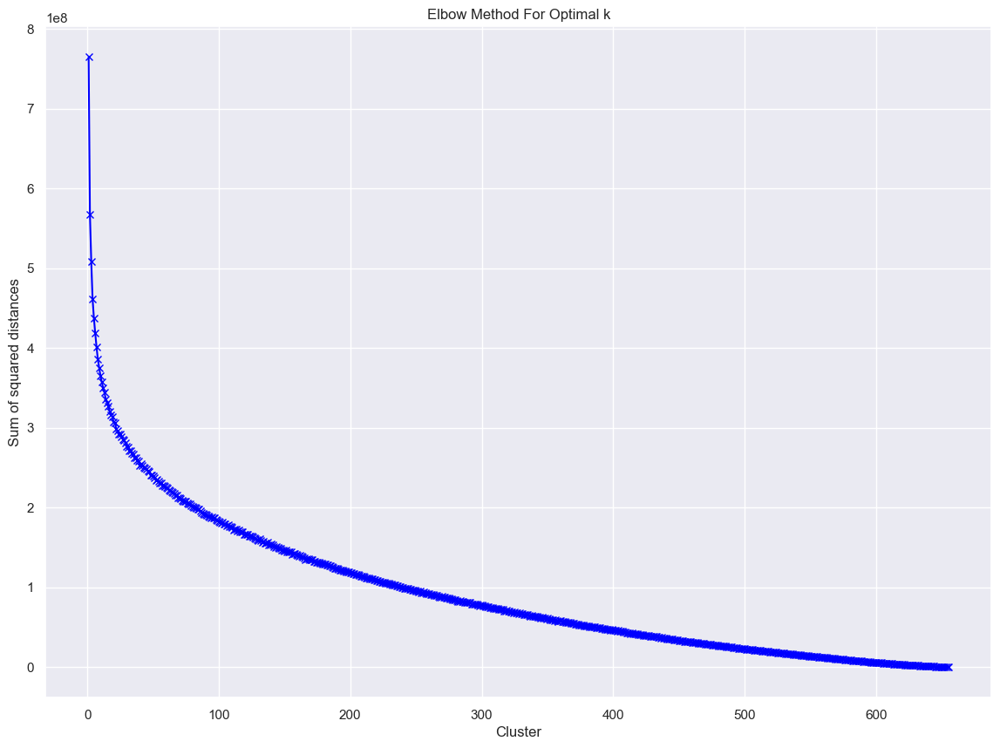

In [16]:
Sum_of_squared_distances = []
K = range(1,656)
for k in K:
    km = KMeans(n_clusters=k, random_state=random_state)
    km = km.fit(input_data)
    Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('Cluster')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k')
plt.show()

### Conclusion on K-Means algorithm:
#### 1.  Note that the silhouette score ranges from -1 to 1, where a higher score indicates better clustering. The adjusted Rand score ranges from -1 to 1, where a score of 0 indicates that the clustering is random and a score of 1 indicates that the clustering is perfect. In the given example we can see that the adjusted rand score is very small and close to approximately zero so we can say that clustering is random. Silhouette ranges from −1 to +1, where a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters, also looking at the Silhouette score also give similar indication. 
#### 2. On the top of it accuracy score is also very poor of only 37.5%.
#### 3. Looking at the elbow graph it is evident that graph is not flatten out even after 600 cluster, which indicate that the data is randonly distributed and it's diffucult to achieve good cluster which improve the accuracy.

#### Q2 Use hierarchical clustering on the data and report the effect of the parameters linkage and distance metric on the number of clusters obtained.

In [17]:
# List of linkage methods and distance metrics  '
linkage_methods = ['average', 'complete', 'ward', 'single']
distance_metrics = ['manhattan', 'cosine', 'euclidean']
distance_theshold_agglo_list = [0.01, 0.1, 0.5, 1.0]

In [70]:
for linkage_method in linkage_methods:
    for distance_metric in distance_metrics:
        for k, distance_theshold_agglo in enumerate(distance_theshold_agglo_list):
            try:            
                evaluation_hierarchical_cluster(input_data, linkage_method, distance_metric, dataset, distance_theshold_agglo, clusters=3)            
            except ValueError:
                print('Unable to calculate the evaluation for this combination')
            except Exception as e:
                print(e)

============Linkage method: average, Distance metric: manhattan, Distance threshold: 0.01 ============
Unable to calculate the evaluation for this combination
============Linkage method: average, Distance metric: manhattan, Distance threshold: 0.1 ============
Unable to calculate the evaluation for this combination
============Linkage method: average, Distance metric: manhattan, Distance threshold: 0.5 ============
Unable to calculate the evaluation for this combination
============Linkage method: average, Distance metric: manhattan, Distance threshold: 1.0 ============
Unable to calculate the evaluation for this combination
============Linkage method: average, Distance metric: cosine, Distance threshold: 0.01 ============
Cluster labels for each point : [520 443 627 335 527 515 639 412 530 440 524 549 493 595 491 503 505 421
 596 423 647 447 523 395 507 365 496 615 459 488 399 649 427 621 379 625
 619 555 504 490 499 577 632 604 349 645 616 623 460 494 518 650 631 607
 297 468 448 366

Silhouette score: -0.0117
Adjusted Rand score: 0.0080
Rand score: 0.5045
Hierarchical Clustering using Agglomerative Clustering:
Accuracy Score: 0.2942
Silhouette score: 0.1959
Adjusted Rand score: 0.0081
Rand score: 0.5027
============Linkage method: average, Distance metric: euclidean, Distance threshold: 0.01 ============
Cluster labels for each point : [515 649 407 486 593 475 544 566 508 587 339 395 583 460 573 500 492 568
 461 442 495 592 365 602 364 399 561 522 523 351 641 445 651 534 524 423
 586 498 655 528 526 631 560 628 643 458 516 398 531 639 563 601 329 446
 622 378 549 404 543 384 537 447 525 585 501 462 529 579 569 349 465 607
 490 567 550 598 640 379 411 283 527 363 350 545 387 608 519 625 409 360
 575 562 345 634 303 359 392 584 555 571 541 357 369 335 430 437 623 588
 464 292 517 576 487 394 459 287 358 503 565 629 491 612 261 626 606 630
 572 652 343 581 340 488 169 557 624 615 390 521 570 338 609 597 605 383
 386 577 325 438 342 594 448 559 536 466 389 453 451 370 

Cluster labels for each point : [533 472 534 376 539 496 365 444 541 476 469 558 502 599 505 466 621 454
 453 456 435 477 393 420 507 396 514 617 373 508 422 523 425 622 395 400
 620 563 519 510 611 583 632 597 427 645 618 624 455 607 509 649 629 612
 600 511 451 603 379 531 540 546 415 348 380 566 605 333 580 627 565 577
 631 423 397 485 593 543 573 409 584 555 430 421 654 378 596 492 385 424
 648 517 335 591 549 382 445 404 457 501 545 497 528 486 529 471 489 642
 525 438 210 623 527 513 532 613 478 310 449 480 374 186 530 571 560 346
 556 585 512 574 419 637 398 367 405 189 578 461 561 587 493 468 614 554
 482 306 652 562 604 608 431 417 564 280 473 282 635 299 250 559 475 537
 576 452 357 544 458 579 269 594 606 641 436 353 590 589 288 526 588 610
 296 334 426 343 391 459 498 495 582 567 328 490 557 521 363 443 277 581
 254 403 470 407 619 464 487 242 569 616 515 655 598 640 568 410 439 550
 638 628 197 462 650 234 305 630 609 570 494 311 592 434 318 355 553 634
 639 447 433 255 42

============Linkage method: complete, Distance metric: euclidean, Distance threshold: 0.01 ============
Cluster labels for each point : [475 369 641 503 598 491 551 570 522 351 492 425 505 485 613 515 506 572
 477 469 617 597 655 605 402 334 566 531 621 394 444 478 376 540 533 463
 590 481 473 536 534 633 565 630 364 484 528 429 594 419 560 604 372 471
 623 512 555 462 549 411 529 439 649 589 517 328 537 583 346 390 511 609
 507 449 396 602 640 567 363 571 653 466 443 625 266 370 391 626 504 400
 624 547 386 635 610 399 489 636 559 474 548 437 403 532 460 464 332 591
 487 373 530 579 615 424 412 580 339 279 606 181 508 614 265 639 608 631
 576 652 480 584 592 494 381 562 361 455 420 336 345 344 612 601 607 355
 416 349 651 581 516 599 472 564 541 413 482 392 513 493 342 240 654 585
 542 330 362 468 628 586 447 358 231 519 593 525 588 558 441 465 395 440
 442 426 255 347 646 561 557 643 327 388 401 246 220 514 407 418 132 417
 298 282 627 245 300 490 502 498 535 518 642 483 296 554 618 

Cluster labels for each point : [599 378 384 505 598 496 552 572 522 356 647 430 536 490 393 517 498 574
 443 474 653 597 357 605 407 478 568 534 607 402 364 398 416 544 537 627
 589 484 515 542 540 633 567 630 361 488 531 435 594 339 561 604 382 476
 623 412 557 439 613 415 527 453 330 588 518 519 543 583 432 397 512 609
 508 429 546 602 641 423 528 573 331 338 501 525 563 371 271 626 593 406
 479 554 392 635 610 405 348 332 562 385 549 477 409 333 462 469 340 590
 492 532 533 579 634 214 524 580 345 645 294 374 509 614 535 363 608 631
 577 652 587 584 639 464 388 564 372 495 422 291 346 376 612 601 303 369
 417 351 651 555 440 600 238 566 545 169 286 358 266 352 344 485 654 585
 272 636 373 473 629 571 507 362 468 520 619 569 293 560 447 471 503 202
 480 431 547 419 646 281 559 643 655 396 578 365 513 425 621 428 467 418
 279 289 628 494 314 486 504 502 461 259 640 395 414 556 616 620 624 460
 450 487 596 472 615 198 427 449 233 403 400 592 285 491 506 381 463 391
 575 426 379 649 55

Cluster labels for each point : [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

In [71]:
for linkage_method in linkage_methods:
    for distance_metric in distance_metrics:
            try:            
                evaluation_hierarchical_cluster_const_distancethreshold(input_data, linkage_method, distance_metric, dataset, clusters=3)
            except ValueError:
                print('Unable to calculate the evaluation for this combination')
            except Exception as e:
                print(e)

============Linkage method: average, Distance metric: manhattan
Unable to calculate the evaluation for this combination
============Linkage method: average, Distance metric: cosine
Cluster labels for each point : [520 443 313 335 527 515 319 412 530 440 524 549 493   1 491 503 505 421
 297 423 323 447 523 395 507 365 496  23 459 488 399 324 427  12 379 312
  21 555 504 490 499 577  39  14 349 102  27  22 460 494 518 147  20   9
   2 468 448 366 338 318 529 511 357 368 343 557 489 362 574  19 429 571
 547 402  21 336 479 251 564 497 578 361 441  19  34 180 591 470 354 315
  73 311 572 587 537 346   2 380 444 351 534 449 516 475 517 442 541  68
 539 408 393  16 264 498 370 407   1  47 454 456 329 327 492 155 552 298
 546 579 375 568 445 307 367 301 320 428 461 457 553 465 538 437  13 543
 458   7  56  39   8  18 469 392 556 355 371 554  17 359 480 550 446 525
 570  17 593 532 436 308 528 589  11  72 406 183 586 476 285 545 415  10
  20 569 372 431 369 424 237 474 576 500 583 360 573 506 

Silhouette score: 0.1156
Adjusted Rand score: 0.0027
Rand score: 0.5542
Hierarchical Clustering using Agglomerative Clustering:
Accuracy Score: 0.0015
Unable to calculate the evaluation for this combination
============Linkage method: single, Distance metric: manhattan
Unable to calculate the evaluation for this combination
============Linkage method: single, Distance metric: cosine
Cluster labels for each point : [442 287 352 286 424 505 483 465 427 523 545 466 391   2 289 499 495 509
 543 338 541 296 407 359 339 303 475  11 487 358 511 513 360   1 408 295
  61 479 385 361 471 514   1   5 415  60   5   1 382 455 544 122   5   3
   1 517 383 512 476 459 147 480 439 310 315 533 441 463 508   5 363 498
 275 429  61 464 343 327 488 274 532 288 414   5   1 403 271 367 329 354
   1 416 521 534 448 493   1 423 317 143 474 179 409 519 410 330  13  62
 535 457 500   5 232 387 353 419   2 122 347 304 501 539 386 379 470 388
 458 518 318 491 447 280 433 291 319 362 297 489 472 313   6 283   1 45

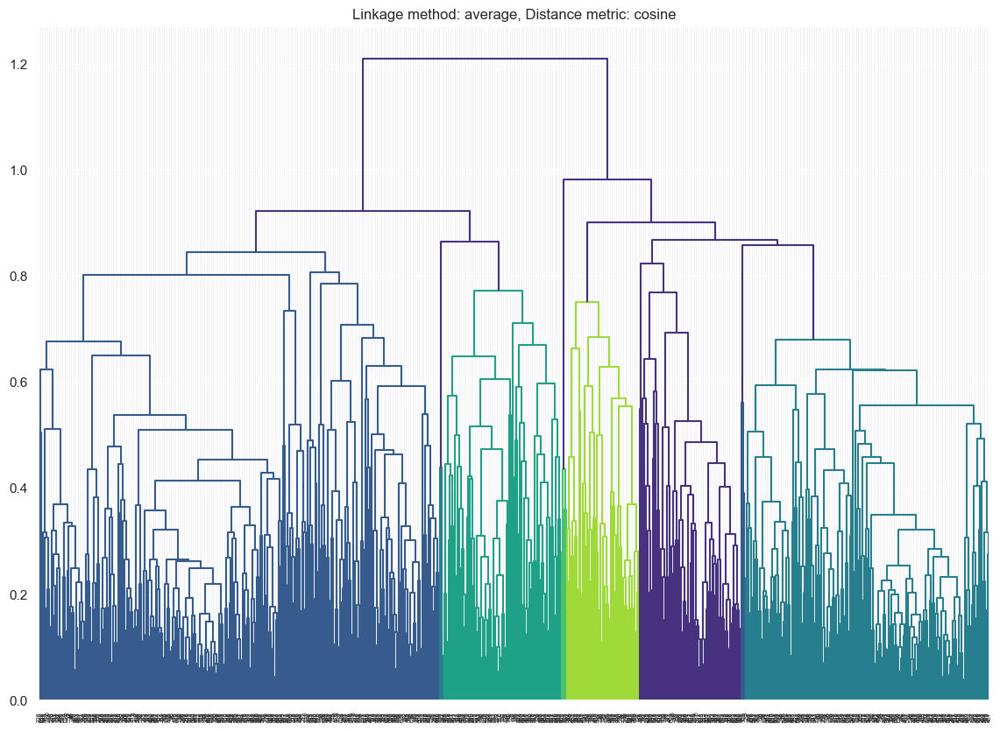

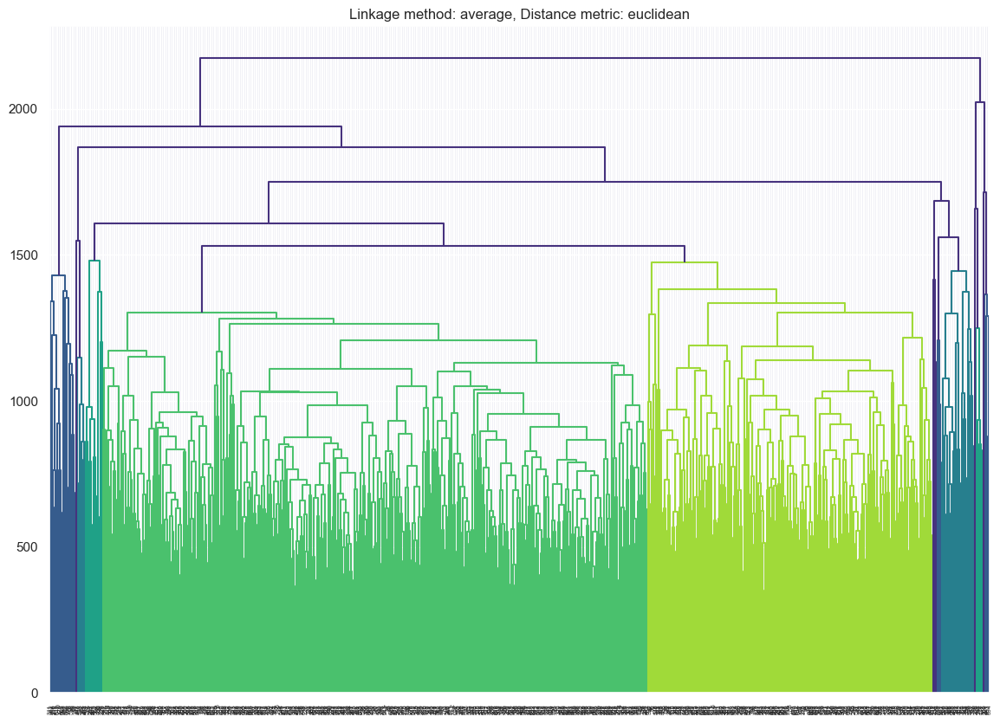

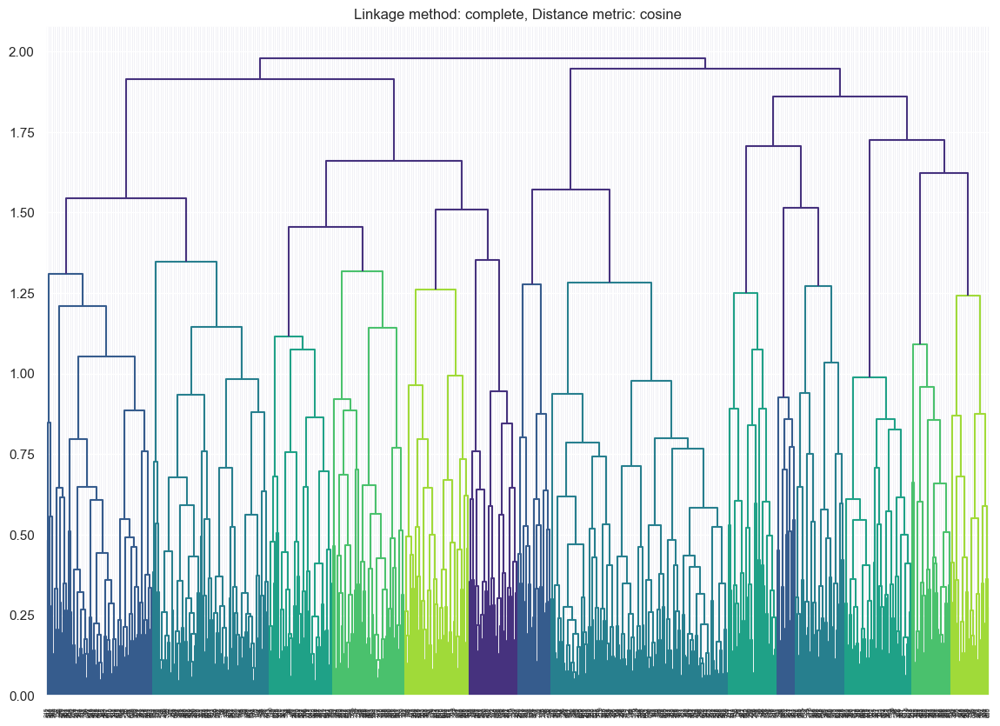

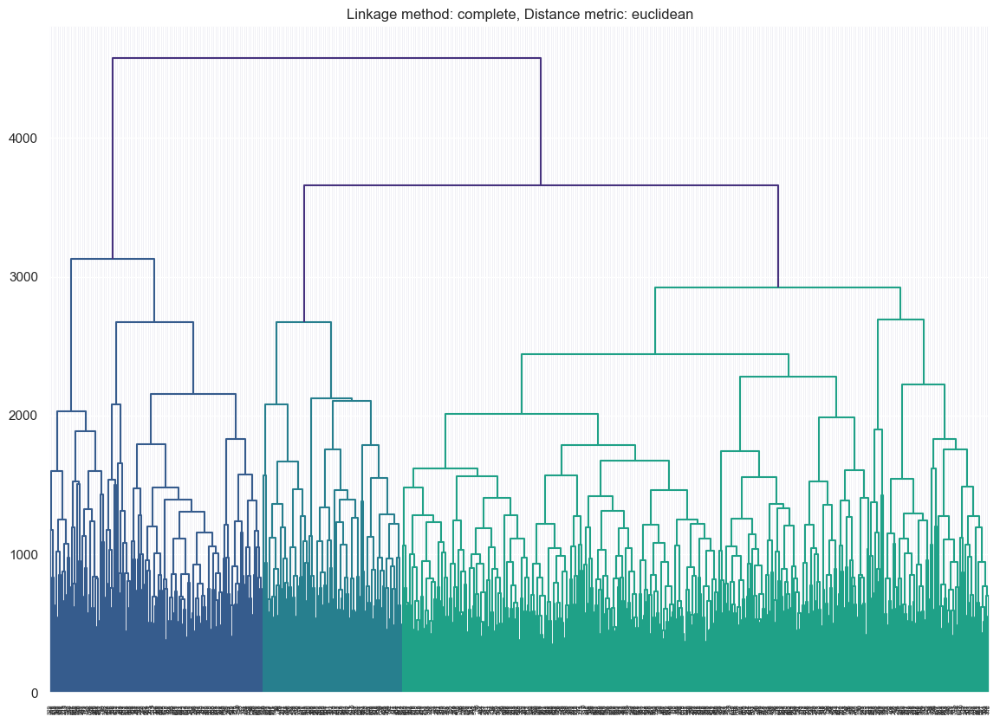

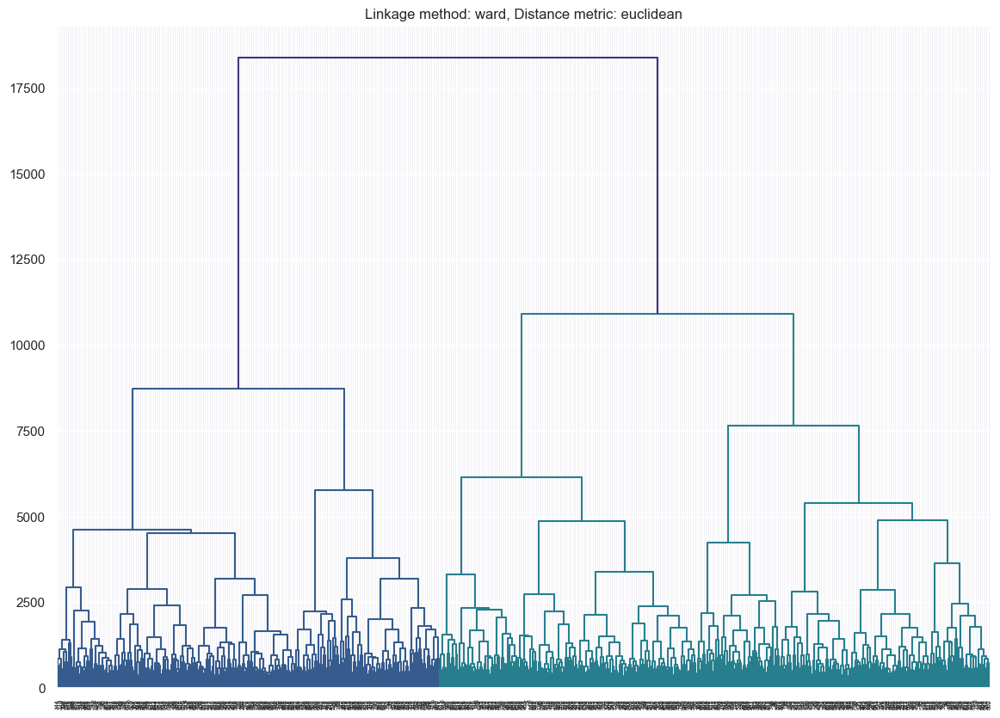

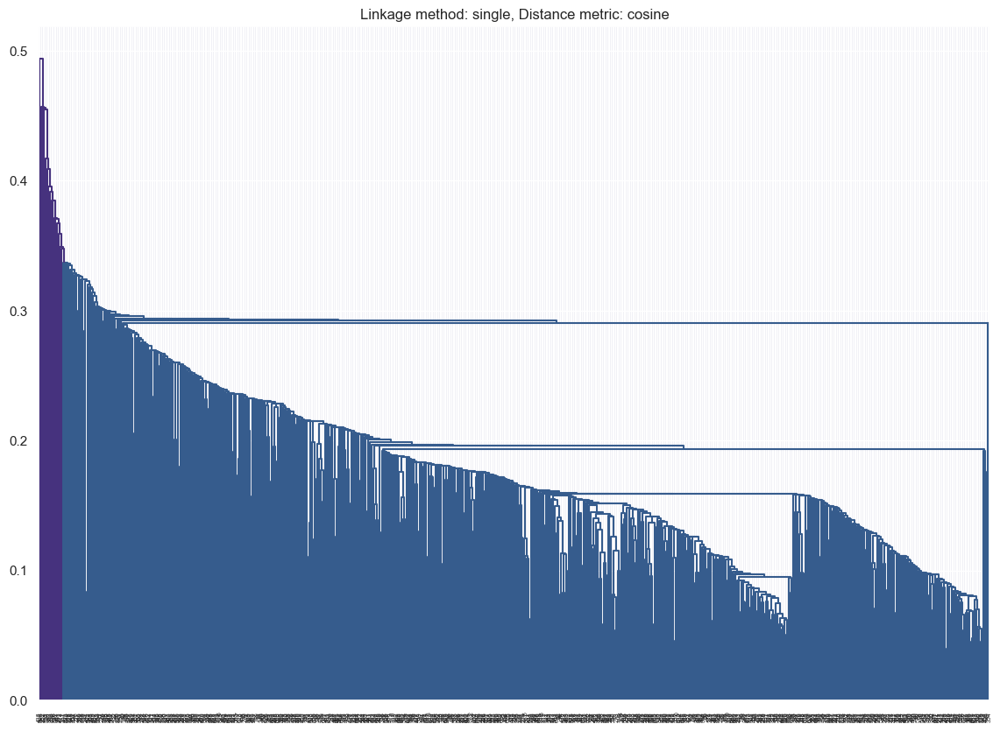

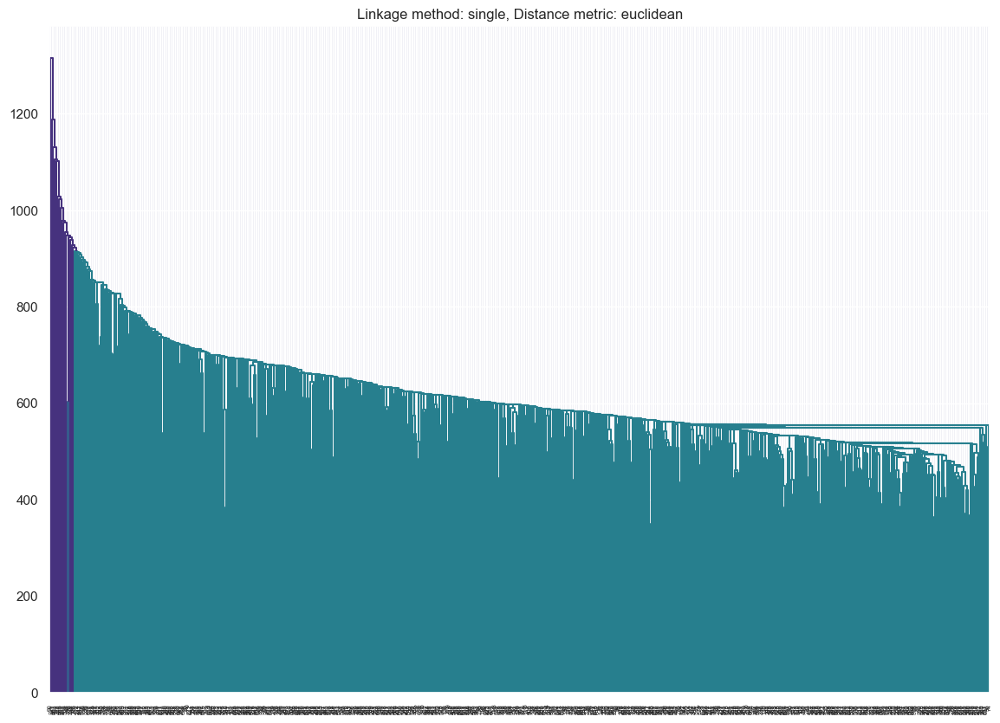

In [37]:
# Calculate the number of clusters for each combination of linkage method and distance metric
for linkage_method in linkage_methods:
    for distance_metric in distance_metrics:
        try:
            plot_dendrogram(input_data, linkage_method, distance_metric)
        except ValueError:
            pass
        except:
            pass

### Conclusion for Hierarchical clustering:  
##### Number of clusters required is appearing for different combination of linkage method and distance metric along with their Rand score, Adjusted Rand score and Silhouette score. Cluster size calculated for hierarchical clustering is very high, which indicate that clustering is happening randomly in case of constant distance threshold, but if we vary the distance threshold along with linkage method and distance metric we can observe that there are couple of selective combination is present for which number of cluster is comparitively less but if we look at overall picture still the cluster size is large enough in most of the combination

#### Q3 Cluster the given data using spectral clustering. Are the obtained clusters better than the ones obtined from K-means or hierarchical clustering?

In [38]:
evaluation_spectral_cluster(input_data, dataset)

Spectral Clustering:
Accuracy Score: 0.3171
Silhouette score: 0.1392
Adjusted Rand score: 0.0043
Rand score: 0.5524


### Clustering information :

#### Number of cluster for different combination in Hierarchical Clustering with constant distance threshold:

| #          | No. of Cluster |
| :--------: |:----------: |
| Linkage method: average, Distance metric: cosine   | 594 |
| Linkage method: average, Distance metric: euclidean | 656 |
| Linkage method: complete, Distance metric: cosine | 598 |
| Linkage method: complete, Distance metric: euclidean | 656 |
| Linkage method: ward, Distance metric: euclidean    | 656 |
| Linkage method: single, Distance metric: cosine    | 546 |
| Linkage method: single, Distance metric: euclidean  | 656 |

#### Number of cluster for different combination in Hierarchical Clustering with different distance threshold:

| #          | No. of Cluster |
| :--------: |:----------: |
| Linkage method: average, Distance metric: cosine, Distance threshold: 0.01    | 656 |
| Linkage method: average, Distance metric: cosine, Distance threshold: 0.1 | 594 |
| Linkage method: average, Distance metric: cosine, Distance threshold: 0.5   | 76 |
| Linkage method: average, Distance metric: cosine, Distance threshold: 1.0 | 2 |
| Linkage method: average, Distance metric: euclidean, Distance threshold: 0.01    | 656 |
| Linkage method: average, Distance metric: euclidean, Distance threshold: 0.1     | 656 |
| Linkage method: average, Distance metric: euclidean, Distance threshold: 0.5  | 656 |
| Linkage method: average, Distance metric: euclidean, Distance threshold: 1.0  | 656 |
| Linkage method: complete, Distance metric: cosine, Distance threshold: 0.01 | 656 |
| Linkage method: complete, Distance metric: cosine, Distance threshold: 0.1 | 598 |
| Linkage method: complete, Distance metric: cosine, Distance threshold: 0.5 | 150 |
| Linkage method: complete, Distance metric: cosine, Distance threshold: 1.0 | 33 |
| Linkage method: complete, Distance metric: euclidean, Distance threshold: 0.01 | 656 |
| Linkage method: complete, Distance metric: euclidean, Distance threshold: 0.1 | 656|
| Linkage method: complete, Distance metric: euclidean, Distance threshold: 0.5 | 656 | 
| Linkage method: complete, Distance metric: euclidean, Distance threshold: 1.0  | 656 |
| Linkage method: ward, Distance metric: euclidean, Distance threshold: 0.01 | 656 |
| Linkage method: ward, Distance metric: euclidean, Distance threshold: 0.1 | 656 |
| Linkage method: ward, Distance metric: euclidean, Distance threshold: 0.5 | 656 |
| Linkage method: ward, Distance metric: euclidean, Distance threshold: 1.0 | 656 |
| Linkage method: single, Distance metric: cosine, Distance threshold: 0.01 | 656 |
| Linkage method: single, Distance metric: cosine, Distance threshold: 0.1  | 546 |
| Linkage method: single, Distance metric: cosine, Distance threshold: 0.5 | 1 |
| Linkage method: single, Distance metric: cosine, Distance threshold: 1.0 | 1 |
| Linkage method: single, Distance metric: euclidean, Distance threshold: 0.01 | 656 |
| Linkage method: single, Distance metric: euclidean, Distance threshold: 0.1 |656 |
| Linkage method: single, Distance metric: euclidean, Distance threshold: 0.5  | 656|
| Linkage method: single, Distance metric: euclidean, Distance threshold: 1.0 | 656 |


### Performance Analyzer :

#### K-Means Clustering :<br>

| #          | Accuracy Score |  Silhouette Score  |  Adjusted Rand Score  |  Rand Score  |
| :--------: | :-------------:|  :-----------:     |  :---------------:    | :----------: |
| K-Means    | 0.3750         |0.0030              | 0.1376                |  0.5573      |

#### Hierarchical Clustering using fcluster  with constant distance threshold:<br>

| #          | Accuracy Score |  Silhouette Score  |  Adjusted Rand Score  |Rand Score  | 
| :--------: | :-------------:|  :-----------:     |  :---------------:    |:----------: |
| Linkage method: average, Distance metric: cosine    |0.1784         |-0.0117            | 0.0080    | 0.5045 |
| Linkage method: average, Distance metric: euclidean |0.3399         |0.2629             | 0.0003    | 0.3438 | 
| Linkage method: complete, Distance metric: cosine   |0.2348         |0.0823             | 0.0018    | 0.5425 | 
| Linkage method: complete, Distance metric: euclidean|0.1326         |0.1230             | 0.0067    | 0.5156 | 
| Linkage method: ward, Distance metric: euclidean    |0.2470         |0.1156             | 0.0027    | 0.5542 | 
| Linkage method: single, Distance metric: cosine     |0.3430         |-0.2514            | 0.0000    | 0.3345 | 
| Linkage method: single, Distance metric: euclidean  |0.3399         |0.2887             | 0.0000    | 0.3345 |


#### Hierarchical Clustering using Agglomerative Clustering with constant distance threshold:<br>

| #          | Accuracy Score |  Silhouette Score  |  Adjusted Rand Score  |Rand Score  |
| :--------: | :-------------:|  :-----------:     |  :---------------:    |:----------: |
| Linkage method: average, Distance metric: cosine    |0.0076         |0.0089            | 0.0006    | 0.6676 |
| Linkage method: average, Distance metric: euclidean |0.0030         |----              |-----     |----- |
| Linkage method: complete, Distance metric: cosine   |0.0076         |0.0102            | 0.0005    | 0.6676 |
| Linkage method: complete, Distance metric: euclidean|0.0030         |----              |----      |---- |
| Linkage method: ward, Distance metric: euclidean    |0.0015         |----             |----    |---- |
| Linkage method: single, Distance metric: cosine     |0.0183         |-0.0374            | 0.0022    | 0.6653 |
| Linkage method: single, Distance metric: euclidean  |0.0015         |----             |----    |---- |


#### Hierarchical Clustering using Agglomerative Clustering with different distance threshold:<br>

| #          | Accuracy Score |  Silhouette Score  |  Adjusted Rand Score  |Rand Score  |
| :--------: | :-------------:|  :-----------:     |  :---------------:    |:----------: |
| Linkage method: average, Distance metric: cosine, Distance threshold: 0.01    |0.0030         |----            | ----    | ---- |
| Linkage method: average, Distance metric: cosine, Distance threshold: 0.1    |0.0076         |0.0089            | 0.0006    | 0.6676 |
| Linkage method: average, Distance metric: cosine, Distance threshold: 0.5 |0.0229         |-0.0417              |0.0092     |0.6534 |
| Linkage method: average, Distance metric: cosine, Distance threshold: 1.0   |0.2942         |0.1959            | 0.0081    | 0.5027 |
| Linkage method: average, Distance metric: euclidean, Distance threshold: 0.01|0.0030         |----              |----      |---- |
| Linkage method: average, Distance metric: euclidean, Distance threshold: 0.1    |0.0030         |----              |----      |---- |
| Linkage method: average, Distance metric: euclidean, Distance threshold: 0.5     |0.0030         |----              |----      |---- |
| Linkage method: average, Distance metric: euclidean, Distance threshold: 1.0  |0.0030         |----              |----      |---- |
| Linkage method: complete, Distance metric: cosine, Distance threshold: 0.01  |0.0015         |----             |----    |---- |
| Linkage method: complete, Distance metric: cosine, Distance threshold: 0.1   |0.0076         |0.0102             |0.0005    |0.6676 |
| Linkage method: complete, Distance metric: cosine, Distance threshold: 0.5  |0.0168         |0.0071             |0.0043    |0.6659 |
| Linkage method: complete, Distance metric: cosine, Distance threshold: 1.0  |0.0777        |-0.0042             |0.0047    |0.6536 |
| Linkage method: complete, Distance metric: euclidean, Distance threshold: 0.01  |0.0030         |----             |----    |---- |
| Linkage method: complete, Distance metric: euclidean, Distance threshold: 0.1  |0.0030         |----             |----    |---- |
| Linkage method: complete, Distance metric: euclidean, Distance threshold: 0.5  |0.0030         |----             |----    |---- |
| Linkage method: ward, Distance metric: euclidean, Distance threshold: 0.1  |0.0015         |----             |----    |---- |
| Linkage method: ward, Distance metric: euclidean, Distance threshold: 0.5  |0.0015         |----             |----    |---- |
| Linkage method: ward, Distance metric: euclidean, Distance threshold: 1.0  |0.0015         |----             |----    |---- |
| Linkage method: single, Distance metric: cosine, Distance threshold: 0.1  |0.0183         |-0.0374             |0.0022    |0.6653 |
| Linkage method: single, Distance metric: cosine, Distance threshold: 0.5  |0.3247         |----             |----    |---- |
| Linkage method: single, Distance metric: cosine, Distance threshold: 1.0  |0.3247         |----             |----    |---- |
| Linkage method: single, Distance metric: euclidean, Distance threshold: 0.01  |0.0015         |----             |----    |---- |
| Linkage method: single, Distance metric: euclidean, Distance threshold: 0.1  |0.0015         |----             |----    |---- |
| Linkage method: single, Distance metric: euclidean, Distance threshold: 0.5  |0.0015         |----             |----    |---- |
| Linkage method: single, Distance metric: euclidean, Distance threshold: 1.0 |0.0015         |----             |----    |---- |


#### Spectral Clustering :<br>

| #          | Accuracy Score |  Silhouette Score  |  Adjusted Rand Score  |  Rand Score  |
| :--------: | :-------------:|  :-----------:     |  :---------------:    | :----------: |
| Spectral Clustering | 0.3171         |0.1392              | 0.0043       | 0.5524       |


### Conclusion: 
##### 1. Looking at  the accuracy score we can observe that K-Means clustering is performing comparitively better than spectral and hierarchical clustering. But overall the accuracy score is not good enough.
##### 2. Silhouette, Rand Score & Adjusted Rand score also indicate the same conclusion.
##### 3. Cluster size calculated for hierarchical clustering is also very high, which indicate that clustering is happening randomly in case of constant distance threshold, but if we vary the distance threshold along with linkage method and distance metric we can observe that there are couple of selective combination is present for which number of cluster is comparitively less but if we look at overall picture still the cluster size is large enough in most of the combination.

#### Q4 Visualize the clusters using the UMAP or tSNE algorithm.

In [39]:
n_neighbors_list = [10, 15, 20]
minimum_dist_list = [0.01, 0.1, 0.5]
n_comp_list = [3]
gen_metric_list = ['euclidean','manhattan','chebyshev','minkowski','mahalanobis','hamming']
perplexity_list = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

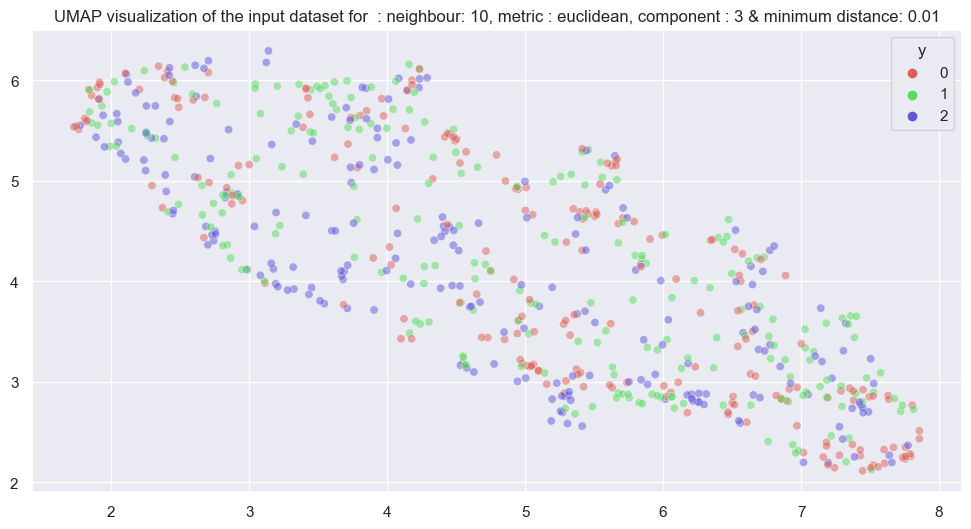

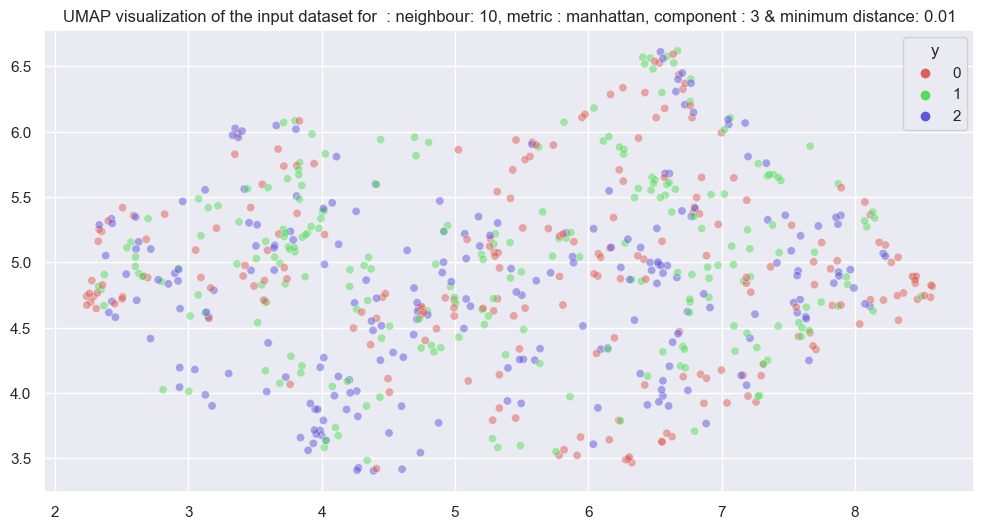

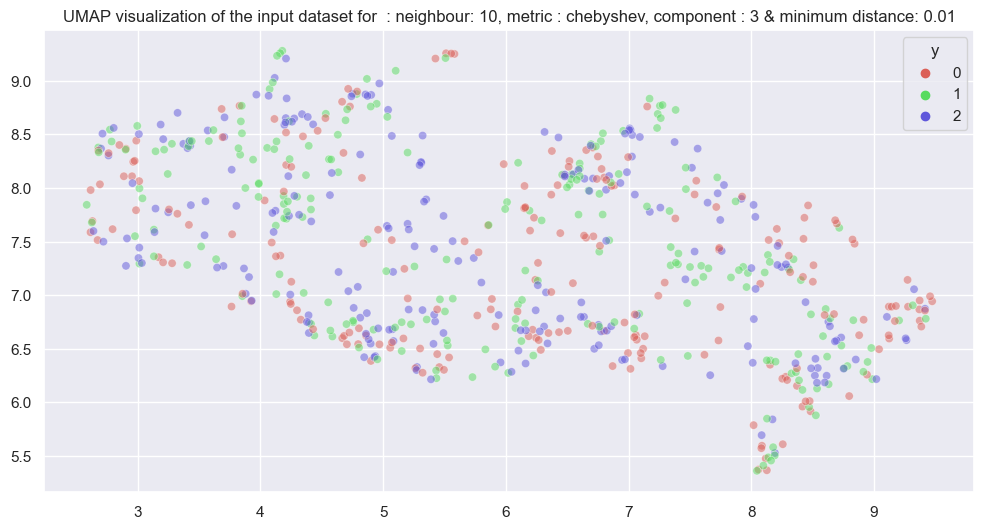

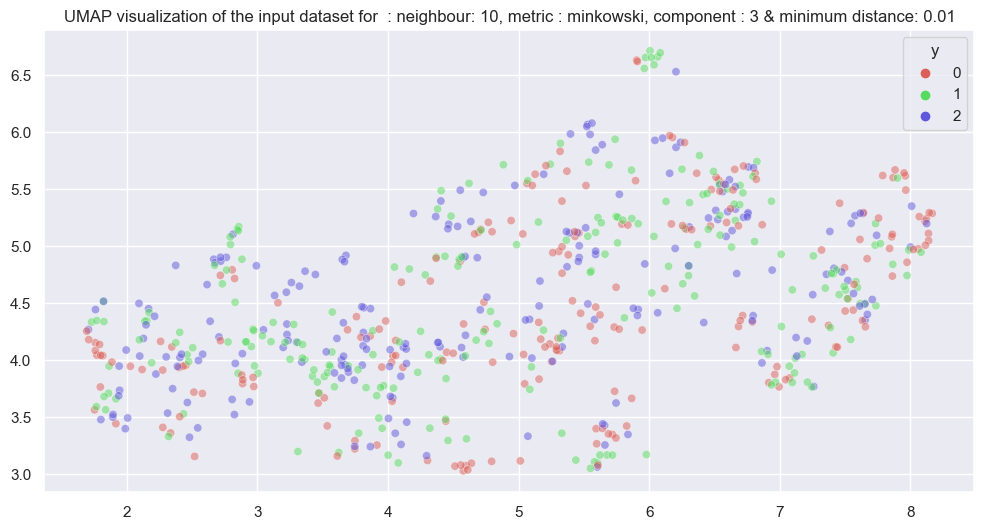

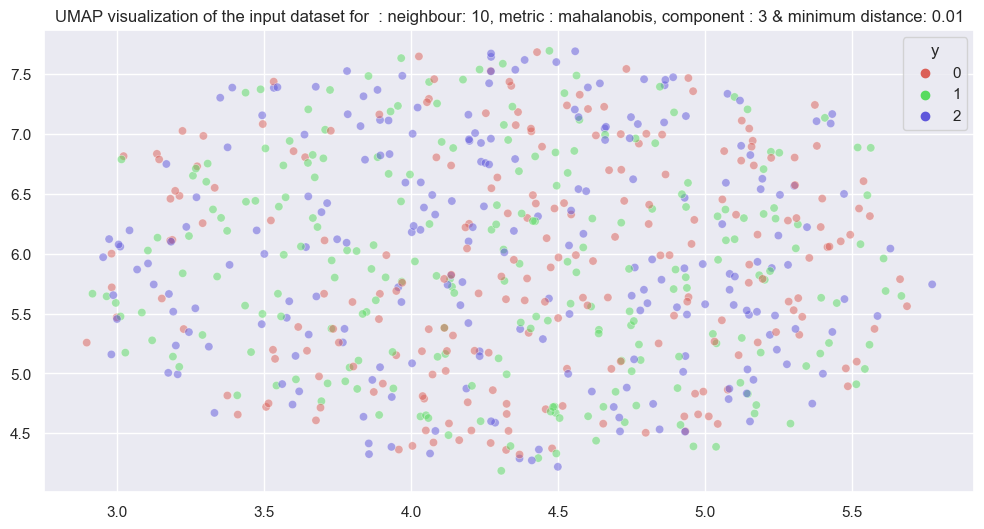

...

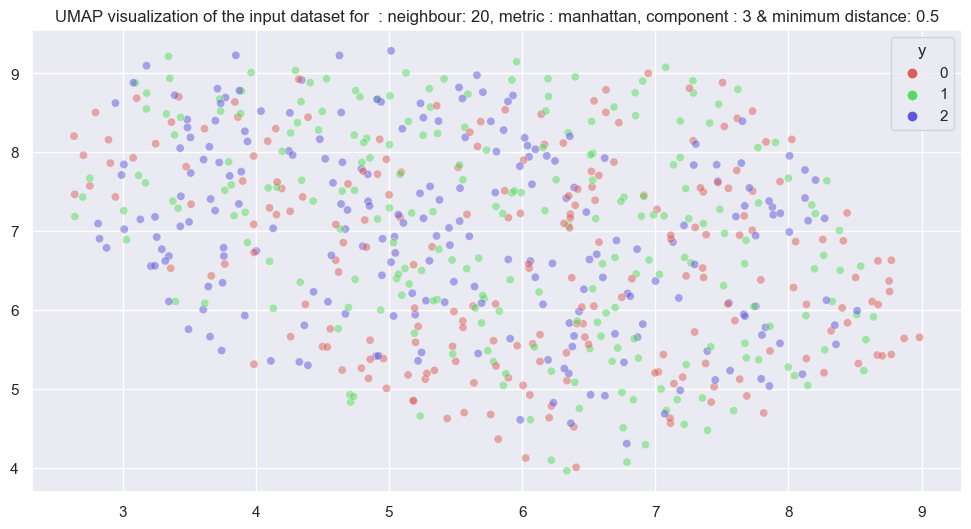

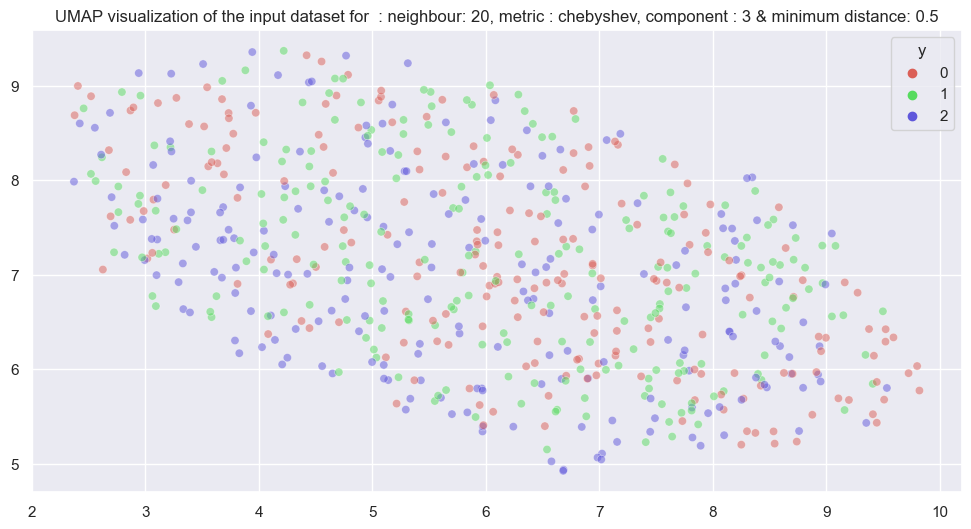

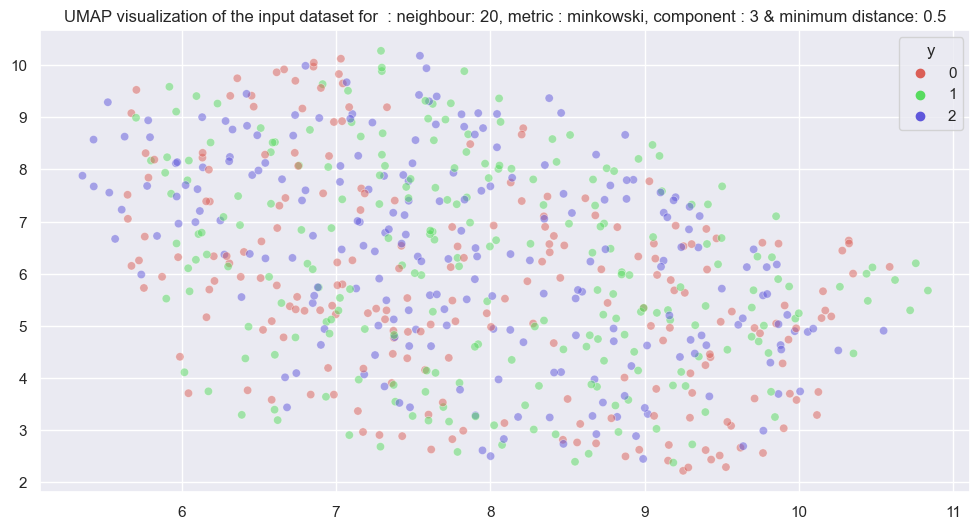

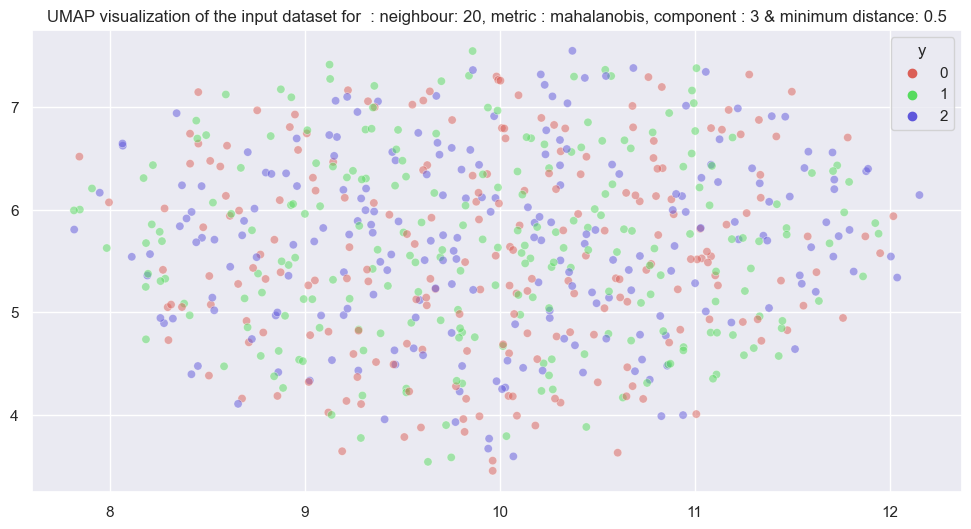

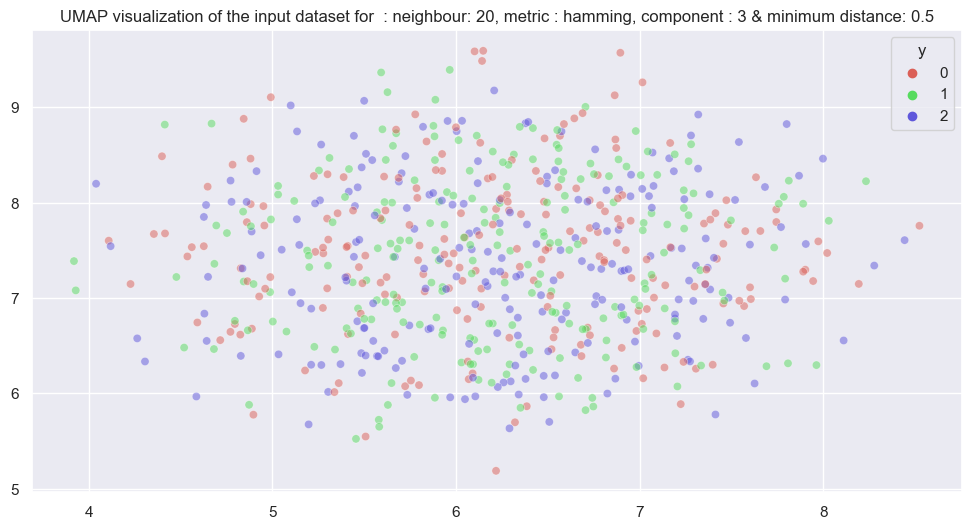

In [40]:
for i, n_neighbors in enumerate(n_neighbors_list):
    for j, min_dist in enumerate(minimum_dist_list):
        for k, metric_val in enumerate(gen_metric_list):
            for l, n_comp in enumerate(n_comp_list): 
                try:
                    #Create a scatter plot for the UMAP embeddings
                    plotUMAPGraph(input_data,output_data, "UMAP visualization of the input dataset for ", "hls",n_neighbors,min_dist,metric_val,n_comp)    
                except Exception as e:
                    #print(e)
                    pass

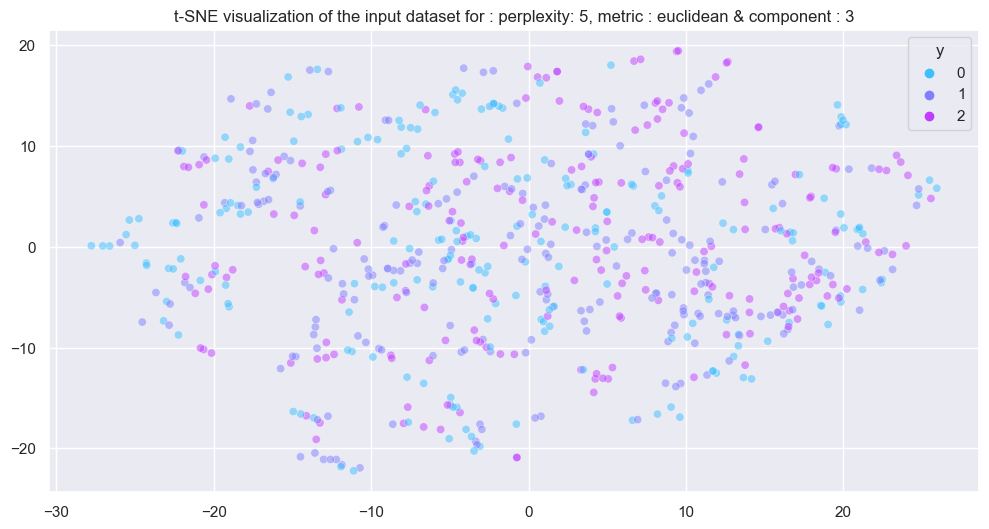

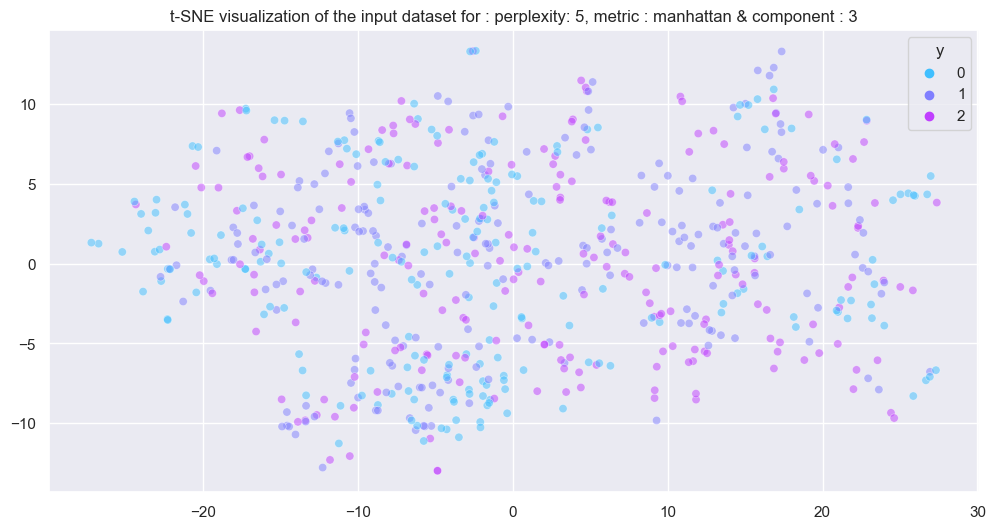

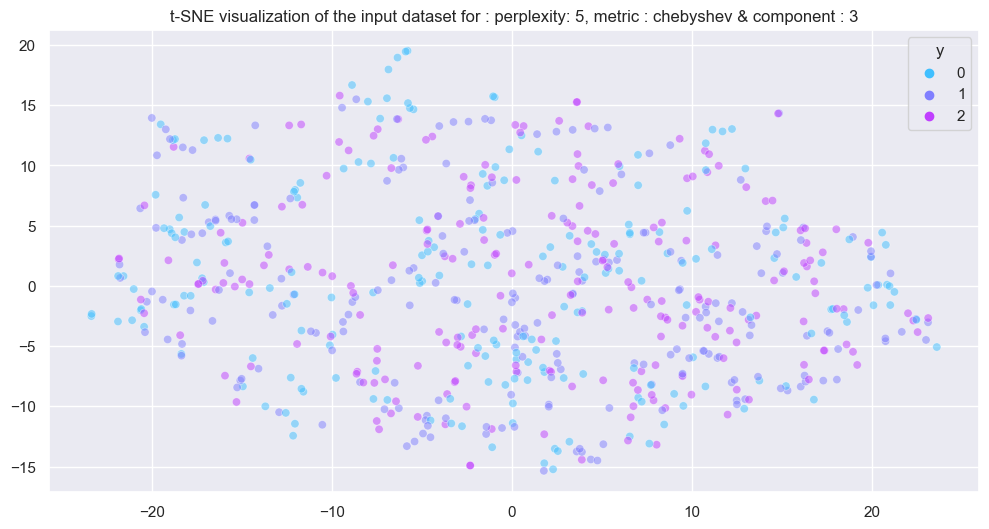

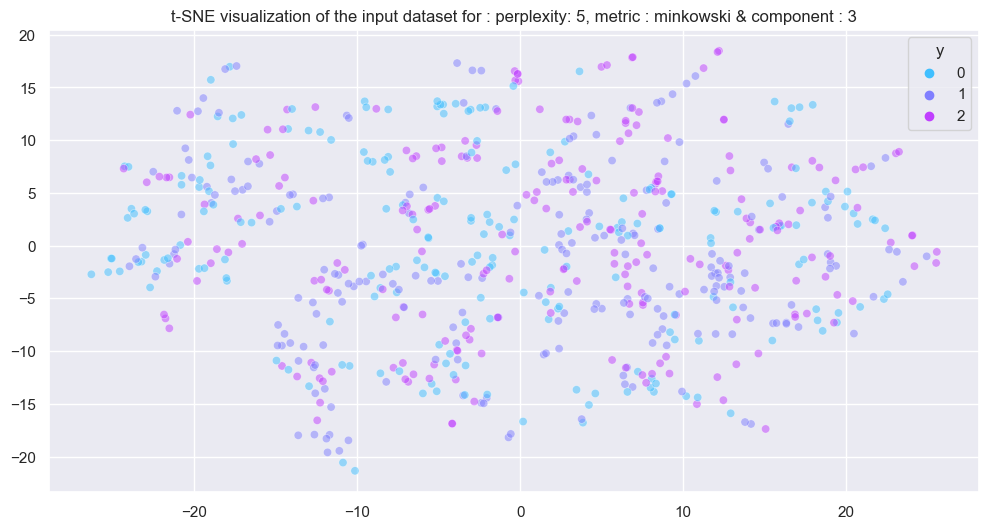

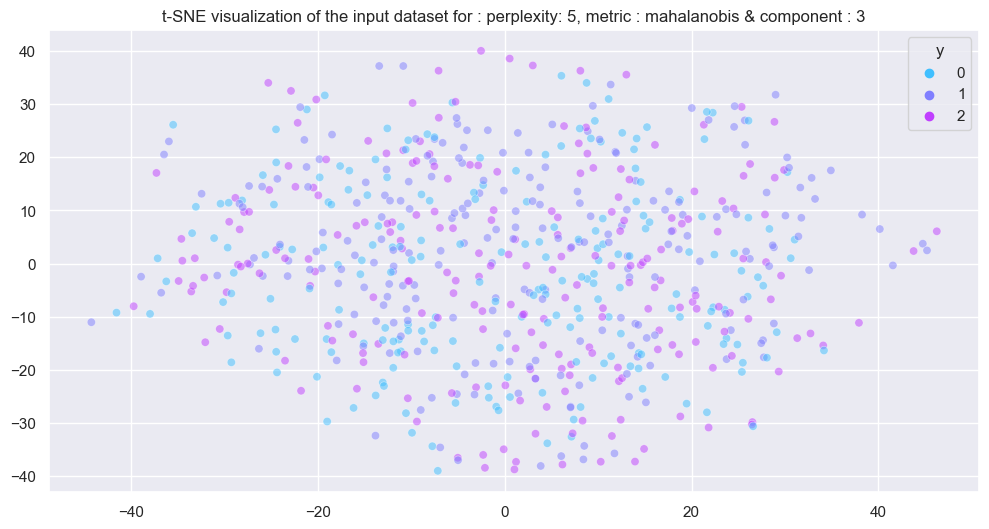

...

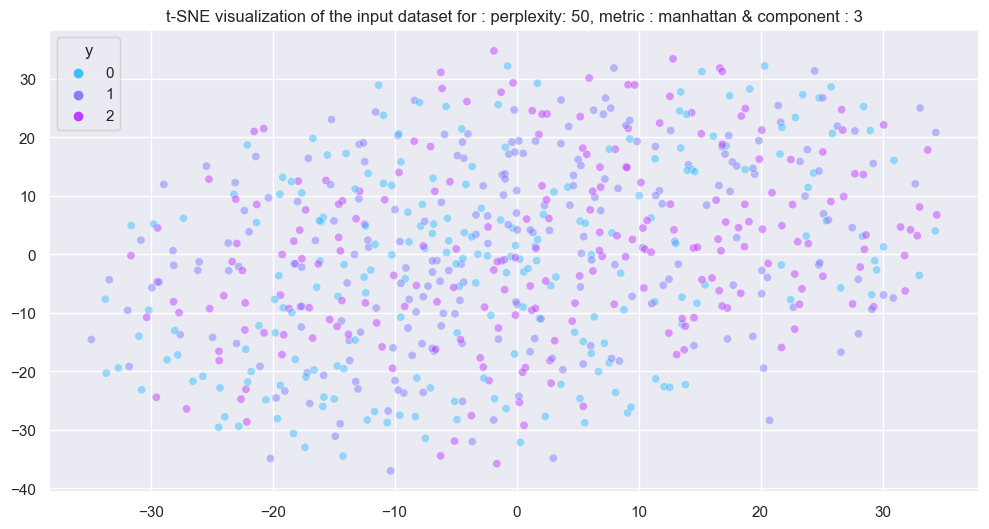

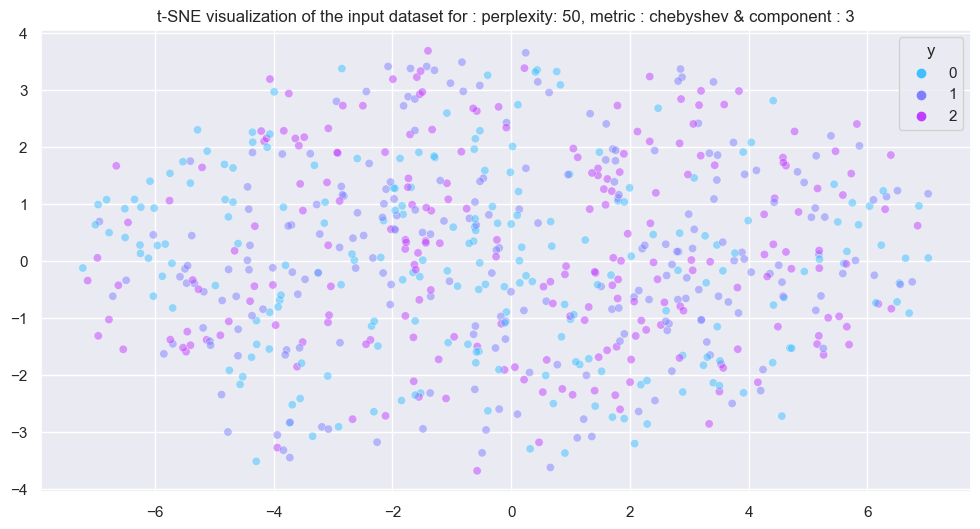

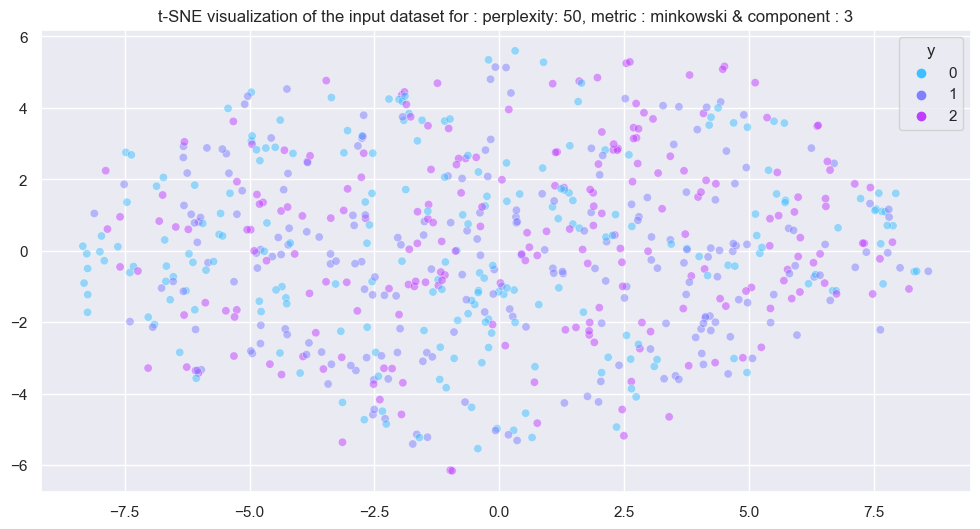

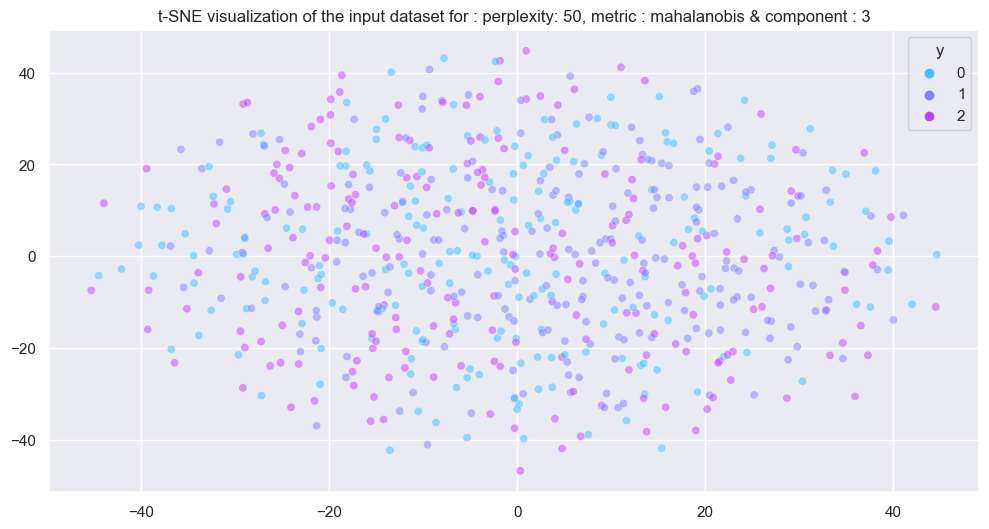

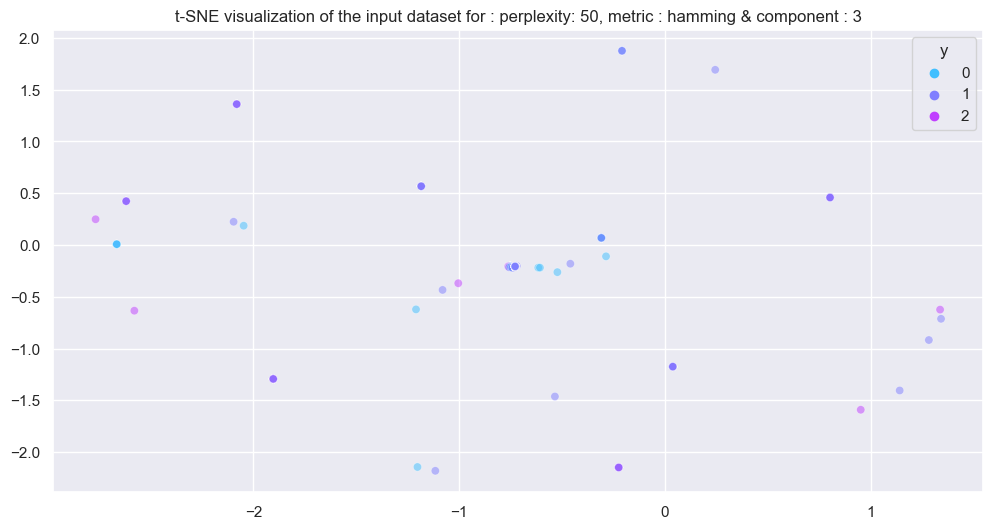

In [41]:
for i, perplexity in enumerate(perplexity_list):
    for j, metric_val in enumerate(gen_metric_list):
        for k, n_comp in enumerate(n_comp_list):            
            try:                  
                # Create a scatter plot for the t-SNE embeddings
                plotTSNEGraph(input_data,output_data, "t-SNE visualization of the input dataset for", "cool", perplexity, metric_val, n_comp)
            except Exception as e:
                #print(e)
                pass

### Conclusion:
#### 1. We have created two plots for both tSNE & UMAP using different combination of parameters like n_neighbour, minimum  disctancem metric value and perplexity.
#### 2. Using unsupervised approach we can see that the data is distributed randomly and no cluster is fomed.
#### 3. We have tried performing clustering on the given data using different methods like KMeans, Hierarchical & Spectral and we have observe that overall the accuracy is poor.
   ######   3.a Among that if we observe the perfomance of different algorithm, accuracy score is highest in KMeans which is 37.5%. But this accuracy is also poor.
   ######   3.b We have also calculate the Rand Score and adjusted rand score which indicates that adjusted Rand score ranges from -1 to 1, where a score of 0 indicates that the clustering is random and a score of 1 indicates that the clustering is perfect, but in my case most of the adjusted rand score value is close to zero which means clustering perform using KMeans, Hierarchical or spectral clustering is random.
   ######   3.c Similarly for Rand score ranges between 0 to 1 with 0 indicating that the two data clusterings do not agree on any pair of points and 1 indicating that the data clusterings are exactly the same. In the  given example highest value of rand score does not cross 0.6 for spectral and 0.5 for hirarchical and KMeans, this also indicate imporper clustering.
   ######   3.d Finally the best performance index parameter  i.e Silhouette score also indicating in the same direction. It ranges from −1 to +1, where a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters. In the given dataset, Silhouette score is alsways stays close to 0 and never cross 0.3 value which indicate poor match with its own cluster.